In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import os
import sys
import pickle
import json
import numpy as np
import math
import av
import torch
import torch.nn as nn
import cv2
import tqdm
import PIL

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import TrainingArguments, Trainer
from huggingface_hub import hf_hub_download
from transformers import AutoFeatureExtractor, AutoImageProcessor, VideoMAEModel, VideoMAEForPreTraining, TimesformerModel, VideoMAEImageProcessor, VideoMAEConfig
from decord import VideoReader, cpu
from IPython.display import Video

/home/ubuntu/anaconda3/envs/sportsformerpy37/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from pytorchvideo.transforms import (
    ApplyTransformToKey,
    Normalize,
    RandomShortSideScale,
    RemoveKey,
    ShortSideScale,
)

from torchvision.transforms import (
    Compose,
    Lambda,
    RandomCrop,
    RandomHorizontalFlip,
    Resize,
    ToTensor,
)

In [52]:
timesformer_feats = pickle.load(open('./SportsFormer/data/ourds_videos_timesformer_features.pickle', 'rb'))

In [4]:
timesformer_feats['video1'].shape

(9, 768)

In [5]:
timesformer_feats['video2'].shape

(10, 768)

In [6]:
gameid_to_videoid = json.load(open("./tools/gameid_eventid2vid.json"))
videoid_to_gameid = {}
for k in gameid_to_videoid.keys():
    videoid_to_gameid[gameid_to_videoid[k]] = k

In [8]:
def get_file_path(videoid):
    return "/home/ubuntu/shared_data/pbp_videos/train/" + videoid_to_gameid[videoid] + ".mp4"

In [9]:
fp = get_file_path("video1")
print(fp)
Video(fp, embed=True)

/home/ubuntu/shared_data/pbp_videos/train/0021800613-7.mp4


In [10]:
fp = get_file_path("video2")
print(fp)
Video(fp, embed=True)

/home/ubuntu/shared_data/pbp_videos/train/0021800613-8.mp4


# Inference

In [11]:
# configuration = TimesformerConfig()
# model = TimesformerModel(configuration)
# configuration = model.config

In [3]:
def sample_frame_indices(clip_len, frame_sample_rate, seg_len):
    converted_len = int(clip_len * frame_sample_rate)
    end_idx = np.random.randint(converted_len, seg_len)
    start_idx = end_idx - converted_len
    indices = np.linspace(start_idx, end_idx, num=clip_len)
    indices = np.clip(indices, start_idx, end_idx - 1).astype(np.int64)
    return indices

In [4]:
class VideoMAEImageProcessorTensor(VideoMAEImageProcessor):
    def preprocess(self, videos, **kwargs):
        processed_videos = [super(VideoMAEImageProcessorTensor, self).preprocess(list(x), **kwargs) for x in videos]
        return processed_videos

In [7]:
# Load model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


model = VideoMAEForPreTraining(VideoMAEConfig())
model.load_state_dict(torch.load("/home/ubuntu/lucas/NSVA/finetuned_model_90masking/model_epoch_1.pt"))
#model = VideoMAEForPreTraining.from_pretrained("MCG-NJU/videomae-base-finetuned-kinetics")

model.to(device)

image_processor = VideoMAEImageProcessorTensor.from_pretrained("MCG-NJU/videomae-base")

In [8]:
mean = image_processor.image_mean
std = image_processor.image_std
resize_to = image_processor.size['shortest_edge']

num_frames_to_sample = model.config.num_frames
sample_rate = 8
fps = 30
clip_duration = num_frames_to_sample * sample_rate / fps

# Validation and evaluation datasets' transformations.
val_transform = Compose(
    [
        Lambda(lambda x: x / 255.0),
        Normalize(mean, std),
        Resize((resize_to, resize_to)),
    ]
)

In [9]:
def get_indices(l, stride=8, batch_size=8):
    num_batches = math.ceil((l / stride) / batch_size)
    padding = num_batches * batch_size - math.ceil(l / stride)
    x = np.arange(0, l, stride)
    x = np.append(x, [0] * padding)
    x = x.reshape((num_batches, batch_size)).astype(np.uint16)
    return x

In [19]:
class VideoDatasetFeatures(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        self.video_files = [f for f in os.listdir(self.root_dir) if os.path.isfile(os.path.join(self.root_dir, f)) and f.endswith('.mp4')]
        print(len(self.video_files))

    def __len__(self):
        return len(self.video_files)
    
    def __getitem__(self, idx):
        video_path = os.path.join(self.root_dir, self.video_files[idx])
        vr = VideoReader(video_path)
        
        # Sample frames
        indices = get_indices(len(vr), batch_size=16)
        frames = torch.from_numpy(vr.get_batch(indices).asnumpy()).permute(3,0,1,2)
        
        if self.transform:
            frames = self.transform(frames)
        
        frames = frames.reshape(-1, 16, 3, 224, 224)
        
        return frames, video_path

In [18]:
len(os.listdir('/home/ubuntu/shared_data/pbp_videos/val/'))

3929

In [21]:
batch_size = 1  # must be 1 for feature extraction
num_workers = 8

train_dataset = VideoDatasetFeatures(root_dir='/home/ubuntu/shared_data/pbp_videos/train/', transform=val_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

val_dataset = VideoDatasetFeatures(root_dir='/home/ubuntu/shared_data/pbp_videos/val/', transform=val_transform)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

test_dataset = VideoDatasetFeatures(root_dir='/home/ubuntu/shared_data/pbp_videos/test/', transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

24138
3929
3952


In [22]:
len(val_loader)

3929

In [84]:
gameid_to_videoid = json.load(open("./tools/gameid_eventid2vid.json"))

In [85]:
features = {}

for loader in [val_loader, train_loader, test_loader]:
    for batch_idx, batch in enumerate(tqdm.tqdm(loader)):
        # Convert the video batch to pixel values and apply normalization
        video_batch, fname = batch
        video_id = fname[0].split('/')[-1].split('.')[0]
        pixel_values = torch.tensor(np.array([x['pixel_values'] for x in image_processor(video_batch.squeeze(0))])).squeeze(1)
        pixel_values = pixel_values.to(device)

        num_frames = 16
        num_patches_per_frame = (model.config.image_size // model.config.patch_size) ** 2
        seq_length = (num_frames // model.config.tubelet_size) * num_patches_per_frame

        mask_ratio = 0
        bool_masked_pos = np.ones(seq_length)
        mask_num = math.ceil(seq_length * mask_ratio)
        mask = np.random.choice(seq_length, mask_num, replace=False)
        bool_masked_pos[mask] = 0
        bool_masked_pos = torch.as_tensor(bool_masked_pos).bool().unsqueeze(0)
        bool_masked_pos = torch.cat([bool_masked_pos for _ in range(pixel_values.shape[0])])

        out = model(pixel_values, bool_masked_pos)
        feats = pool_layer(out.logits.permute(0,2,1)).squeeze(2).detach().cpu().numpy()
        features[gameid_to_videoid[video_id]] = feats
        break
    break
    
    with open('finetuned_model_features.pickle', 'wb') as f:
        pickle.dump(features, f)

  0%|                                                                                                                                  | 0/5 [00:07<?, ?it/s]


In [86]:
out.loss

tensor(1.2465, device='cuda:0', grad_fn=<MseLossBackward0>)

In [69]:
with open('finetuned_model_features.pickle', 'wb') as f:
    pickle.dump(features, f)

In [70]:
# with open('finetuned_model_features.pickle', 'rb') as f:
#     x = pickle.load(f)
#     print(x)

{'video13098': array([[0.5266631 , 0.4307006 , 0.510616  , ..., 0.47676298, 0.40293315,
        0.58200437],
       [0.5266631 , 0.4307006 , 0.510616  , ..., 0.47676298, 0.40293315,
        0.58200437],
       [0.5266631 , 0.4307006 , 0.510616  , ..., 0.47676298, 0.40293315,
        0.58200437],
       [0.5266631 , 0.4307006 , 0.510616  , ..., 0.47676298, 0.40293315,
        0.58200437],
       [0.5266631 , 0.4307006 , 0.510616  , ..., 0.47676298, 0.40293315,
        0.58200437]], dtype=float32)}


In [53]:
timesformer_feats['video133']

array([[ 4.9433416e-01,  9.4197798e-01,  1.7462815e+00, ...,
        -6.9902027e-01, -1.6688955e+00,  3.0752882e-01],
       [ 1.4930949e+00,  1.0860661e+00,  2.2192614e+00, ...,
         2.5159326e-01, -8.1436831e-01, -6.4270490e-01],
       [ 1.9242526e+00,  1.1941879e+00,  1.1414267e+00, ...,
         3.2556584e-04, -2.2476850e-02, -8.8623124e-01],
       ...,
       [-2.4927576e-01,  7.5203305e-01,  1.5365125e+00, ...,
        -5.5670333e-01, -1.7346315e+00,  5.2006740e-02],
       [-5.1639944e-01,  1.1489033e+00,  1.7900726e+00, ...,
        -5.6197697e-01, -1.5592316e+00,  4.1227221e-01],
       [-4.9881071e-01,  1.0364774e+00,  1.9571341e+00, ...,
        -3.6247674e-01, -1.5715218e+00,  2.9463693e-01]], dtype=float32)

In [20]:
out.loss

tensor(1.2465, device='cuda:0', grad_fn=<MseLossBackward0>)

In [23]:
out.logits.shape

torch.Size([5, 1568, 1536])

In [28]:
pool_layer = nn.AvgPool1d(1568)
pool_layer(out.logits.permute(0,2,1)).squeeze(2).shape

torch.Size([5, 1536])

In [ ]:
print("# frames:", len(vr))
print("Size of frame:", vr[0].shape)

In [3]:
image_processor = AutoImageProcessor.from_pretrained("MCG-NJU/videomae-base")
pool_layer = nn.AvgPool1d(1568)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [15]:
# n = "video15"
# fp = get_file_path(n)
# vr = VideoReader(fp)
# print(timesformer_feats[n].shape)
# print(len(vr))

In [17]:
#l = math.floor(len(vr) / 64)
#indices = sample_frame_indices(clip_len=8, frame_sample_rate=8, seg_len=len(vr))
#indices = np.linspace(0, 8 * 4 - 1, num=8).astype(np.int64)
indices = get_indices(len(vr))[0]
video = vr.get_batch(indices).asnumpy()
#video = video.reshape((indices.shape[0], indices.shape[1], video.shape[1], video.shape[2], video.shape[3]))

In [18]:
video.shape

(8, 720, 1280, 3)

In [19]:
image_processor = AutoImageProcessor.from_pretrained("MCG-NJU/videomae-base")
model = TimesformerModel.from_pretrained("facebook/timesformer-base-finetuned-k400")
#model = VideoMAEModel.from_pretrained("MCG-NJU/videomae-base-finetuned-kinetics")
pool_layer = nn.AvgPool1d(1568)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
Some weights of the model checkpoint at facebook/timesformer-base-finetuned-k400 were not used when initializing TimesformerModel: ['classifier.weight', 'classifier.bias']
- This IS expected if you are initializing TimesformerModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TimesformerModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [20]:
inputs = image_processor(list(video), return_tensors="pt")
outputs = model(**inputs)
encoded_output = pool_layer(outputs.last_hidden_state.squeeze().permute(1,0)).squeeze().detach()
list(encoded_output.shape)

/home/ubuntu/anaconda3/envs/sportsformerpy37/lib/python3.9/site-packages/transformers/feature_extraction_utils.py:147: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/torch/csrc/utils/tensor_new.cpp:230.)
  return torch.tensor(value)


[768]

In [21]:
np.array(encoded_output[:20])

array([-0.48870674,  0.17189096,  1.387643  ,  0.15442124,  0.7024087 ,
       -0.4163027 , -0.05715502, -0.6665116 ,  0.7987739 ,  0.48709157,
       -0.5326734 , -0.8708405 , -0.9189843 , -0.7393774 , -0.26849702,
       -0.4824393 ,  0.4664684 ,  0.41373706,  0.713856  ,  0.76455605],
      dtype=float32)

In [22]:
timesformer_feats['video2026'][0][:20]

array([-0.28445885,  0.3280588 ,  0.7984966 ,  0.24042349,  0.11575934,
       -0.35225427, -0.22374485, -1.2848899 ,  0.22751968,  1.4893687 ,
       -0.796549  , -1.3215448 ,  0.17896114,  0.17838795,  0.23428501,
       -1.3560222 , -0.85627764, -0.6471325 ,  0.9636439 ,  1.2405788 ],
      dtype=float32)

# Training

In [23]:
def sample_frame_indices(clip_len, frame_sample_rate, seg_len):
    converted_len = int(clip_len * frame_sample_rate)
    end_idx = np.random.randint(converted_len, seg_len)
    start_idx = end_idx - converted_len
    indices = np.linspace(start_idx, end_idx, num=clip_len)
    indices = np.clip(indices, start_idx, end_idx - 1).astype(np.int64)
    return indices

In [24]:
class VideoDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        self.video_files = [f for f in os.listdir(self.root_dir) if os.path.isfile(os.path.join(self.root_dir, f)) and f.endswith('.mp4')]

    def __len__(self):
        return 5#len(self.video_files)
    
    def __getitem__(self, idx):
        video_path = os.path.join(self.root_dir, self.video_files[idx])
        vr = VideoReader(video_path)
        
        # Sample frames
        indices = sample_frame_indices(clip_len=16, frame_sample_rate=8, seg_len=len(vr))
        frames = torch.from_numpy(vr.get_batch(indices).asnumpy()).permute(3,0,1,2)
        
        if self.transform:
            frames = self.transform(frames)
        
        frames = frames.permute(1,0,2,3)
        
        return frames

In [25]:
class VideoMAEImageProcessorTensor(VideoMAEImageProcessor):
    def preprocess(self, videos, **kwargs):
        processed_videos = [super(VideoMAEImageProcessorTensor, self).preprocess(list(x), **kwargs) for x in videos]
        return processed_videos

In [150]:
# Initialize the model and image processor
model = VideoMAEForPreTraining.from_pretrained("MCG-NJU/videomae-base-finetuned-kinetics")
image_processor = VideoMAEImageProcessorTensor.from_pretrained("MCG-NJU/videomae-base")

# Define the loss function
criterion = torch.nn.MSELoss()

# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

loading configuration file config.json from cache at /home/ubuntu/.cache/huggingface/hub/models--MCG-NJU--videomae-base-finetuned-kinetics/snapshots/4800870825aa2ee4430280b6a6a3f6cabf2d68b7/config.json
Model config VideoMAEConfig {
  "architectures": [
    "VideoMAEForVideoClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "decoder_hidden_size": 384,
  "decoder_intermediate_size": 1536,
  "decoder_num_attention_heads": 6,
  "decoder_num_hidden_layers": 4,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "abseiling",
    "1": "air drumming",
    "2": "answering questions",
    "3": "applauding",
    "4": "applying cream",
    "5": "archery",
    "6": "arm wrestling",
    "7": "arranging flowers",
    "8": "assembling computer",
    "9": "auctioning",
    "10": "baby waking up",
    "11": "baking cookies",
    "12": "balloon blowing",
    "13": "bandaging",
    "14": "barbequing",
    "15": "bartending",
    "16": "beatboxing

VideoMAEForPreTraining(
  (videomae): VideoMAEModel(
    (embeddings): VideoMAEEmbeddings(
      (patch_embeddings): VideoMAEPatchEmbeddings(
        (projection): Conv3d(3, 768, kernel_size=(2, 16, 16), stride=(2, 16, 16))
      )
    )
    (encoder): VideoMAEEncoder(
      (layer): ModuleList(
        (0): VideoMAELayer(
          (attention): VideoMAEAttention(
            (attention): VideoMAESelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=False)
              (key): Linear(in_features=768, out_features=768, bias=False)
              (value): Linear(in_features=768, out_features=768, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): VideoMAESelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): VideoMAEIntermediate(
            (dense): Linear(in_features=

In [28]:
mean = image_processor.image_mean
std = image_processor.image_std
resize_to = image_processor.size['shortest_edge']

num_frames_to_sample = model.config.num_frames
sample_rate = 8
fps = 30
clip_duration = num_frames_to_sample * sample_rate / fps

# Training dataset transformations.
train_transform = Compose(
    [
        Lambda(lambda x: x / 255.0),
        Normalize(mean, std),
        RandomShortSideScale(min_size=256, max_size=320),
        RandomCrop(resize_to),
        RandomHorizontalFlip(p=0.5),
    ]
)

# Validation and evaluation datasets' transformations.
val_transform = Compose(
    [
        Lambda(lambda x: x / 255.0),
        Normalize(mean, std),
        Resize((resize_to, resize_to)),
    ]
)

base_transform = Compose([
    ToTensor(),
])

In [76]:
batch_size = 1
num_workers = 32

train_dataset = VideoDataset(root_dir='/home/ubuntu/shared_data/pbp_videos/train/', transform=train_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

val_dataset = VideoDataset(root_dir='/home/ubuntu/shared_data/pbp_videos/val/', transform=val_transform)
val_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

test_dataset = VideoDataset(root_dir='/home/ubuntu/shared_data/pbp_videos/test/', transform=val_transform)
test_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

/home/ubuntu/anaconda3/envs/sportsformerpy37/lib/python3.9/site-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [30]:
if False:
    for i, batch in enumerate(train_loader):
        print(i, batch.shape)
        break

In [31]:
model_name = "VideoMAE-finetuned-basketball"
num_epochs = 1

args = TrainingArguments(
    model_name,
    remove_unused_columns=False,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    warmup_ratio=0.1,
    logging_steps=1,
    load_best_model_at_end=True,
    push_to_hub=False,
    do_train=True,
    do_eval=True,
    dataloader_pin_memory=False,
    num_train_epochs=num_epochs,
    fp16=True,
    #metric_for_best_model='eval_loss',
)


In [32]:
def collate_fn(examples, mask_ratio=0.9):
    pixel_values = torch.stack(examples).to(device)
    
    num_frames = 16
    num_patches_per_frame = (model.config.image_size // model.config.patch_size) ** 2
    seq_length = (num_frames // model.config.tubelet_size) * num_patches_per_frame
    # bool_masked_pos = torch.randint(0, 2, (batch_size, seq_length)).bool()
    # bool_masked_pos = bool_masked_pos.to(device)
    
    bool_masked_pos = np.ones(seq_length)
    mask_num = math.ceil(seq_length * mask_ratio)
    mask = np.random.choice(seq_length, mask_num, replace=False)
    bool_masked_pos[mask] = 0
    bool_masked_pos = torch.as_tensor(bool_masked_pos).bool().unsqueeze(0)
    bool_masked_pos = torch.cat([bool_masked_pos for _ in range(batch_size)])
    
    return {"pixel_values": pixel_values, "bool_masked_pos": bool_masked_pos}

In [33]:
class CustomTrainer(Trainer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def compute_loss(self, model, inputs, return_outputs=False):
        outputs = model(**inputs)
        loss = outputs["loss"]

        return (loss, outputs) if return_outputs else loss

In [34]:
trainer = Trainer(
    model,
    args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=image_processor,
    data_collator=collate_fn,
)

Using cuda_amp half precision backend


In [35]:
def train(trainer, checkpoint=None):
    train_result = trainer.train(resume_from_checkpoint=checkpoint)
    trainer.save_model()
    trainer.log_metrics("train", train_result.metrics)
    trainer.save_metrics("train", train_result.metrics)
    trainer.save_state()
    return

In [36]:
# train(trainer)

In [37]:

def main():
    # Alternative Implementation

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    train_loss_list = []

    # Loop through each epoch
    num_epochs = 2
    for epoch in range(num_epochs):
        print
        # Loop through each batch
        for batch_idx, video_batch in enumerate(tqdm.tqdm(train_loader)):        
            # Convert the video batch to pixel values and apply normalization
            pixel_values = torch.tensor([x['pixel_values'] for x in image_processor(video_batch)]).squeeze(1)
            pixel_values = pixel_values.to(device)

            # Feed the pixel values through the model
            num_frames = 16
            num_patches_per_frame = (model.config.image_size // model.config.patch_size) ** 2
            seq_length = (num_frames // model.config.tubelet_size) * num_patches_per_frame

            # bool_masked_pos_list = [torch.randint(0, 2, (1, seq_length)).bool() for _ in range(batch_size)]
            # bool_masked_pos = torch.cat(bool_masked_pos_list)
            # bool_masked_pos = bool_masked_pos.to(device)

            mask_ratio = 0.9
            bool_masked_pos = np.ones(seq_length)
            mask_num = math.ceil(seq_length * mask_ratio)
            mask = np.random.choice(seq_length, mask_num, replace=False)
            bool_masked_pos[mask] = 0
            bool_masked_pos = torch.as_tensor(bool_masked_pos).bool().unsqueeze(0)
            bool_masked_pos = torch.cat([bool_masked_pos for _ in range(batch_size)])

            outputs = model(pixel_values, bool_masked_pos)

            # Calculate the loss
            loss = outputs.loss

            # Backpropagate and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

#             # Save the model every epoch
#             if batch_idx == len(train_loader) - 1:
#                 torch.save(model.state_dict(), f"finetuned_model/model_epoch_{epoch}.pt")

#             # Save the training loss every 50 batches
#             if batch_idx % 50 == 0:
#                 train_loss_list.append((epoch, batch_idx, loss.item()))
#                 np.savetxt("finetuned_model/train_loss.txt", train_loss_list)

            # Print progress
            if batch_idx % 100 == 0:
                print(f"Epoch {epoch}, Batch {batch_idx}: Loss = {loss.item()}")

In [38]:
# VideoReader("/home/ubuntu/shared_data/pbp_videos/train/0021800238-376.mp4")

In [39]:
np.zeros((1,2))

array([[0., 0.]])

# Graphs for training

In [40]:
import matplotlib.pyplot as plt

In [44]:
x[-1]

6773.0

In [54]:
filename = "/home/ubuntu/lucas/NSVA/finetuned_model/train_loss.txt"
x, y = [], []
warmup = 100
with open(filename) as f:
    c = 0
    for line in f:
        c += 1
        if c < warmup: continue
        data = np.array(line.split(" "), dtype=float)
        if len(data) < 3: continue
        x.append(data[1])
        y.append(data[2])

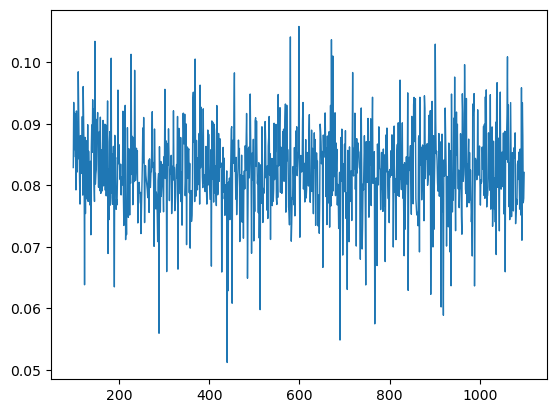

In [55]:
plt.plot(x[:1000], y[:1000], linewidth=1)
plt.show()

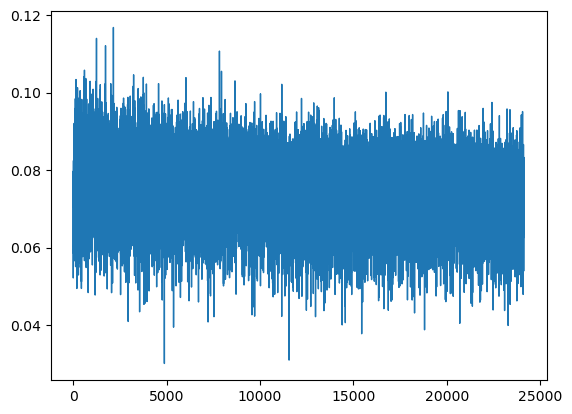

In [56]:
plt.plot(x, y, linewidth=1)
plt.show()

In [69]:
N = 1000
newy = np.convolve(y, np.ones(N)/N, mode='valid')
newx = list(range(len(newy)))
error = np.var(y)

In [70]:
error

4.803739447065855e-05

In [71]:
len(x[499:-500]), len(newx)

(47176, 47176)

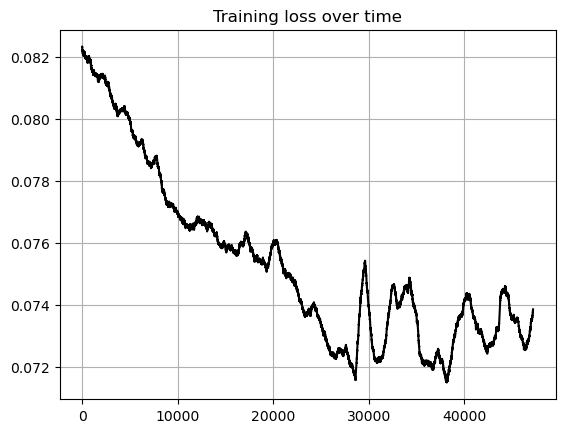

In [73]:
#plt.plot(newx, y[int(N/2)-1:-int(N/2)], linewidth=.1, color='red', alpha=0.5)
plt.plot(newx, newy, color='black')
#plt.ylim(0.07, 0.09)

plt.title("Training loss over time")
#plt.fill_between(newx, newy-error, newy+error, alpha=0.5, facecolor='red')
plt.grid()
plt.show()